<a href="https://colab.research.google.com/github/SS-Hossain/Dog-Breed-Classification/blob/main/Dog_Breed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 🐶 End-to-end Multi-class Dog Breed Classification
This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.
When i'm sitting at the cafe and I take a photo of a dog,want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle.

## 3. Evaluation
The evaluation is a file with prediction probabilities forr each dog breed of each test image.
[Dog Breed Identification - Kaggle](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

## 4. Features
Some information about the data:


*   We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
*   There are 120 breeds of dogs (this means there are 120 different classes).


*   There are around 10k+ images in the training set(this images have labels).
*   There are around 10k+ images in the test set(this images have no labels, because we'll want to predict them).





In [3]:
#!unzip "drive/MyDrive/Dog_Breed_Classification/dog-breed-identification.zip" -d "drive/MyDrive/Dog_Breed_Classification/"

### Get our workspace ready


*   Import TensorFlow 2.x ✅
*   Import TensorFlow Hub ✅
*   Make sure we're using GPU ✅






In [4]:
#import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub-version:", hub.__version__)

# Chech for GPU availability
print("GPU","available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

TF version: 2.15.0
TF hub-version: 0.16.1
GPU Not available :(


## 1. Getting our Data Ready
Turning images into Tensors(numerical representations)

let's start by using our data and checking out the labels.

In [5]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_Breed_Classification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


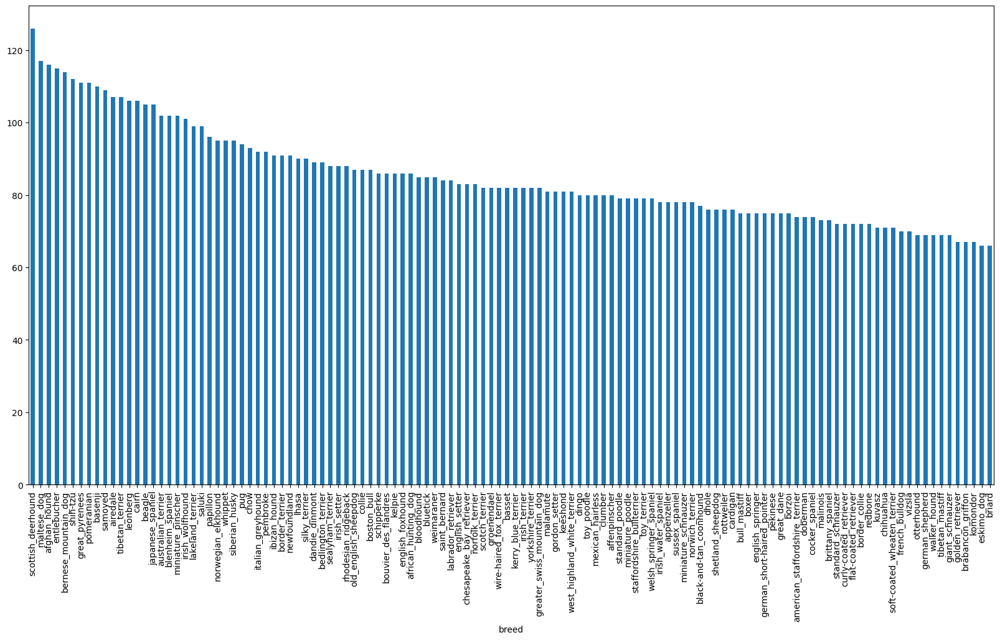

In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot(kind = "bar",figsize=(20,10));

In [7]:
labels_csv["breed"].value_counts().median()

82.0

## Getting our images on colab
Means the images in the folder to put on the colab

i.e - How to put this serial id 000bec180eb18c7604dcecc8fe0dba07 onto colab  



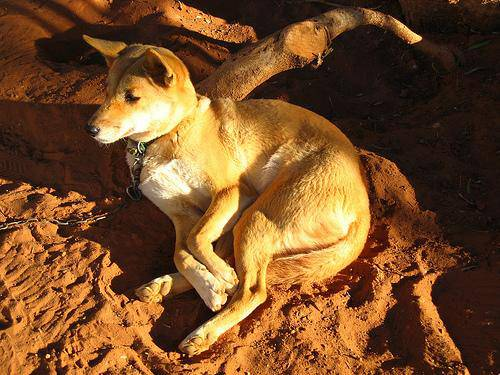

In [8]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog_Breed_Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# create pathnames from image ID's
filenames = ["drive/MyDrive/Dog_Breed_Classification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog_Breed_Classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Breed_Classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog_Breed_Classification/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print("Filenames do not match actual amount of files,check the target directory.")

Filenames match actual amount of files!!! proceed.


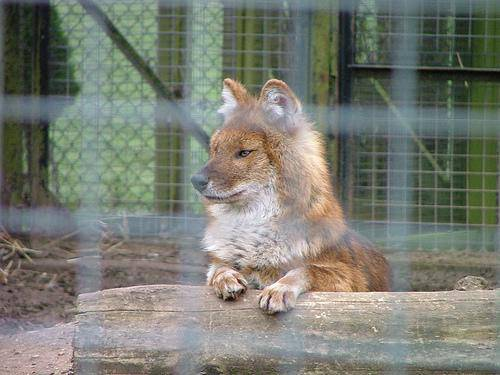

In [12]:
Image(filenames[257])

### Turning Data labels into Numbers

Since we've now got our training image filepaths in a list, let's prepare our labels.



In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels) # does same thing as above
labels ## All 10222 breed will be contained including same as many as possible

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# see if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Not matched")

Number of labels matches the number of filenames


In [16]:
#Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds #120

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [19]:
# Turn every label into boolean array
boolean_labels = [lb == unique_breeds for lb in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the dataset from kaggle doesn't come with a validation set, we're going to create or own.

In [23]:
# Setup X and y variables
X = filenames
y = boolean_labels

We'e going to start off experimenting with ~1000 images and increase as needed

In [24]:
#set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [25]:
#let's split our data
from sklearn.model_selection import train_test_split
np.random.seed(42)
#split them into train and validation data set of total size of NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size = 0.2)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

### Preprocessing Images(turning images/texts into tensors)

Before we do , let's see what importing an image looks like.


In [26]:
#convert images into Numpy arrays
from matplotlib.pyplot import imread
image = imread(filenames[42])

In [27]:
image.shape

(257, 350, 3)

In [28]:
#turn image ito tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

### Function to preprocess images

In [29]:
# Define image size
IMG_SIZE = 224
# Create function
def imageToTensors(image_path):
  """
  Takes an image from filenames and turn it into tensors. Preprocessing function
  """
  # read image and save it into image variable
  image  = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensors with 3(RGB) color channels
  image  = tf.image.decode_jpeg(image,channels = 3)
  # Normalizing the image from (0-255) to (0-1)
  image  = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image (224,224)
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  # Return image
  return image

### Turning our data into batches

In [30]:
# Create a simple function to return a tuple of tensors like this: `(image,label)`
def get_image_label(image_path,label):
  """
  takes an image file path name and associated label, then processes
  the iamge and returns atuple of (image,label).
  """
  image = imageToTensors(image_path)
  return image,label

In [31]:
# Demo of the above
(imageToTensors(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [32]:
get_image_label(X[42],tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

### Turn all of our Data(X and y) into Batches

In [33]:
import tensorflow as tf

BATCH_SIZE = 32

def create_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """"
    Creates batches of data out of image (X) and label(y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
        data_batch = data.map(imageToTensors).batch(batch_size)
        return data_batch
    # If the data is valid dataset, use get_image_label to map and pass two arguments as X(filenames) and y(labels)
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch
    # If the data is a training dataset, shuffle the data to get efficient output with minimum span of time

    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

In [34]:
# Assuming X_train, y_train, X_val, y_val are properly formatted
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in bathes, these can be a little hard to understand, let's visualize them.

In [36]:
import matplotlib.pyplot as plt
np.random.seed(42)
def show_25_images(images, labels):
    """
    Displays 25 images from a data batch along with their labels.
    """
    plt.figure(figsize=(10, 7))

    # Loop through 25 images (for displaying)
    for i in range(25):
        # Create subplot (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i + 1)

        # Display image
        plt.imshow(images[i])  # Use images[i] to display the current image

        # Add the image title (assuming labels are one-hot encoded)
        plt.title(unique_breeds[labels[i].argmax()])  # Display the index of the label

        # Turn the grid lines off
        plt.axis("off")




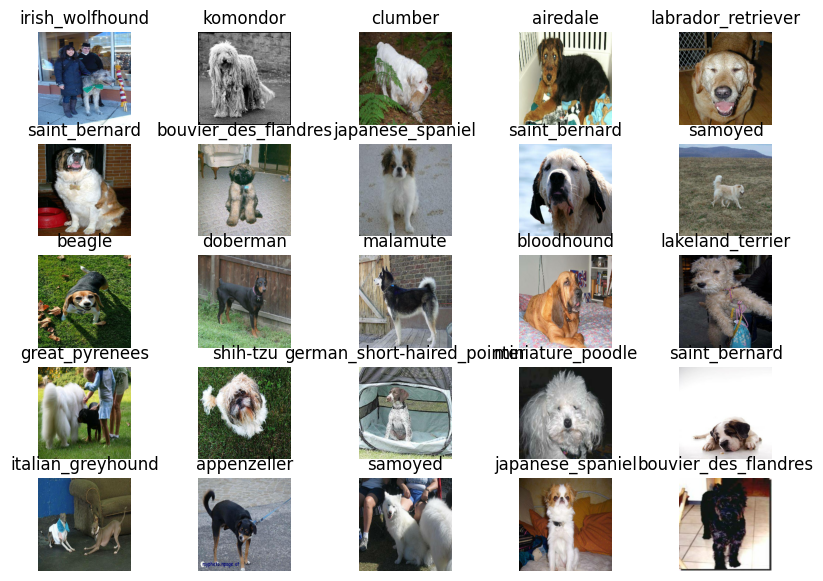

In [37]:
# Assuming 'train_data' is an iterator yielding images and labels
train_images, train_labels = next(train_data.as_numpy_iterator())

# Show 25 images from the batch
show_25_images(train_images, train_labels)

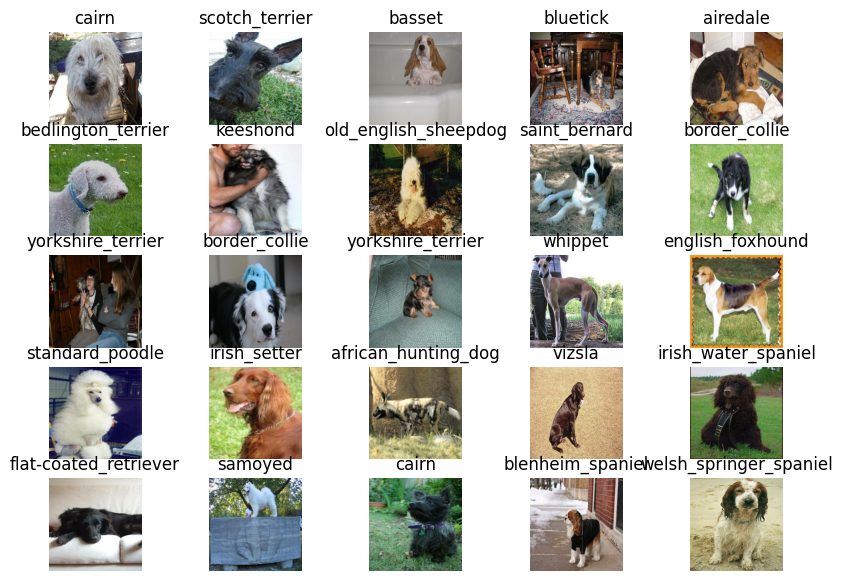

In [38]:
# now let's see for validation data set
val_images,val_labels = next(val_data.as_numpy_iterator())
# Show 25 images from the batch
show_25_images(val_images,val_labels)

##2. Building Our Model

Before we build a model, there are few things we need to define
* The input shape to our model
* The output shape of our model
* The URL of a pretrained model to use
* What activation function to use
* What loss function to use
* What optimizer to use

In [39]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,color channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)


In [40]:
# Setup Model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

## Putting input output shape into a keras deep learning model

In [41]:
# create a function which builds a kears model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  #layer1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,activation = "softmax") #output layer
  ])

  #compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [42]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### 3. Evaluation our Model

### Creating Callbacks

#### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1.   Load the tensorBoard notebook extension ✅
2.   Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.✅
3.   Visualize our models training logs with the `%tensorboard` magic function







In [43]:
 # load tensorBoard notebook extension
 %load_ext tensorboard

In [44]:
import datetime

# create a function to build a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog_Breed_Classification/logs",
                        datetime.datetime.now().strftime(" %Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Prevents overfitting

In [45]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model (on subset of data)
our first model is going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS = 10 #@param {type:"slider",min:10,max:100,step:10}

In [47]:
# Chech for GPU availability
print("GPU","available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

GPU Not available :(


## Let's create a function which Trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` on our model passing it the training data, validation data, number of epochs to train for `NUM_EPOCHS` and callbacks we would like to use
* Return the model

In [48]:
# Function to train model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create model
  model = create_model()

  # Create new tensorboard session everytime we train model
  tensorboard = create_tensorboard_callback()

  # Call the fit function
  model.fit(
      x = train_data,
      epochs = NUM_EPOCHS,
      validation_data = val_data,
      validation_freq = 1,
      callbacks = [tensorboard,early_stopping]
  )

  # Return the model
  return model

In [49]:
# Fit the model to the data
# model = train_model()
# model

## Techniques to prevent overfitting in Neural Networks

(https://www.kaggle.com/discussions/general/175912)

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents.

In [50]:
%tensorboard --logdir drive/MyDrive/Dog_Breed_Classification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [51]:
#Make predictions on the validation data
predictions = model.predict(val_data,verbose = 1)
predictions

7/7 [==============================] - 423s 70s/step


array([[8.7405980e-04, 1.7404010e-03, 3.3966046e-02, ..., 4.3986351e-03,
        2.5449316e-03, 3.1372551e-03],
       [2.2860642e-03, 2.7356083e-03, 2.2479566e-02, ..., 1.5489665e-03,
        3.0386817e-02, 4.7198944e-03],
       [3.5879788e-05, 5.8857527e-02, 4.5931670e-03, ..., 4.9461345e-03,
        1.0689178e-03, 2.0571880e-02],
       ...,
       [6.0393102e-03, 1.5570956e-02, 1.6693560e-02, ..., 2.6375933e-02,
        1.3353130e-02, 2.2672225e-02],
       [1.0690672e-03, 2.0101531e-03, 2.3897160e-03, ..., 2.2282510e-03,
        2.4747769e-03, 3.2781553e-03],
       [3.3659332e-03, 7.4263033e-03, 3.3918701e-03, ..., 1.9505838e-03,
        1.0128525e-02, 1.8923091e-04]], dtype=float32)

In [52]:
predictions.shape

(200, 120)

In [53]:
np.sum(predictions[0])

1.0

In [54]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.4946220e-03 5.2047931e-03 8.9730099e-03 9.3363173e-04 3.0898720e-03
 6.8774982e-03 1.7178569e-03 4.9260990e-03 1.0046406e-02 7.6262834e-03
 1.1823480e-03 9.0840533e-03 4.2574517e-03 3.3331076e-03 5.8166096e-03
 5.8352377e-04 4.5799087e-03 2.7966520e-03 1.0101909e-03 9.0223756e-03
 1.3288432e-03 7.0909029e-03 4.2020120e-03 1.5339599e-03 2.8265089e-02
 9.3449475e-03 5.1207779e-05 1.7092277e-03 1.0450662e-03 7.0369855e-04
 8.4116841e-03 1.8751239e-02 4.7218194e-03 3.0122823e-03 4.6307258e-03
 1.3519016e-03 9.0764631e-03 4.8944945e-03 3.2024300e-03 2.2902873e-03
 5.4542096e-03 1.0484757e-03 6.4870145e-04 5.6768750e-04 3.4080166e-02
 1.8394239e-02 3.5952888e-03 1.0327741e-02 7.6087588e-04 2.9471162e-04
 3.5648074e-02 2.1749935e-03 1.6515625e-04 1.0025371e-02 3.3423207e-03
 7.2795548e-03 5.7797097e-02 8.2391985e-03 1.9625159e-02 3.3577658e-02
 9.4232801e-03 4.5239814e-03 8.2955818e-04 8.3334278e-03 2.4053363e-04
 1.4866671e-03 1.1404859e-02 4.3972991e-03 4.1331006e-03 6.7062268e-04
 3.131

In [55]:
## Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

In [56]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Unbatchify a batch dataset.
    """
    images = []
    labels = []
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

# unbatchify the validation data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction Label
* Validation label
* Validation images

Let's make more visualize

In [59]:
## Function to viuslize
def visualize_pred(prediction_probabilities,labels,images,n = 1):
  """
  view the first n predictions
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])


  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)


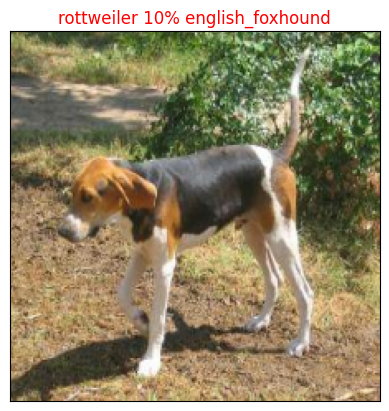

In [60]:
visualize_pred(prediction_probabilities = predictions,
              labels = val_labels,
              images = val_images,
              n = 42)

## Funtion to make top 10 predictions of the models

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob,true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot the image
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_labels,rotation = "vertical")

  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


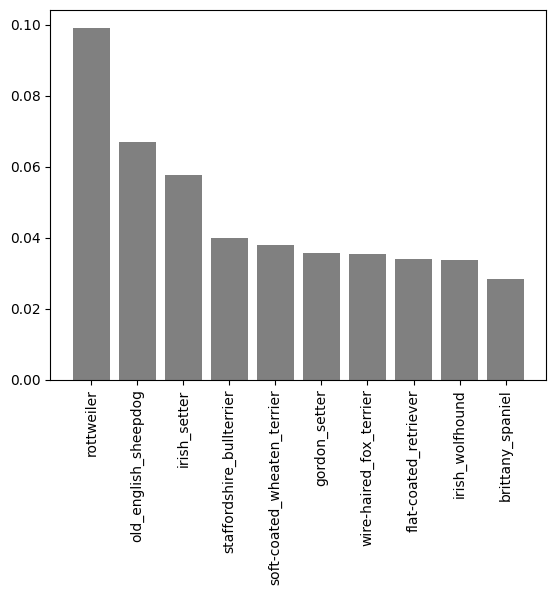

In [62]:
plot_pred_conf(
    prediction_probabilities = predictions,
    labels = val_labels,
    n = 42
)

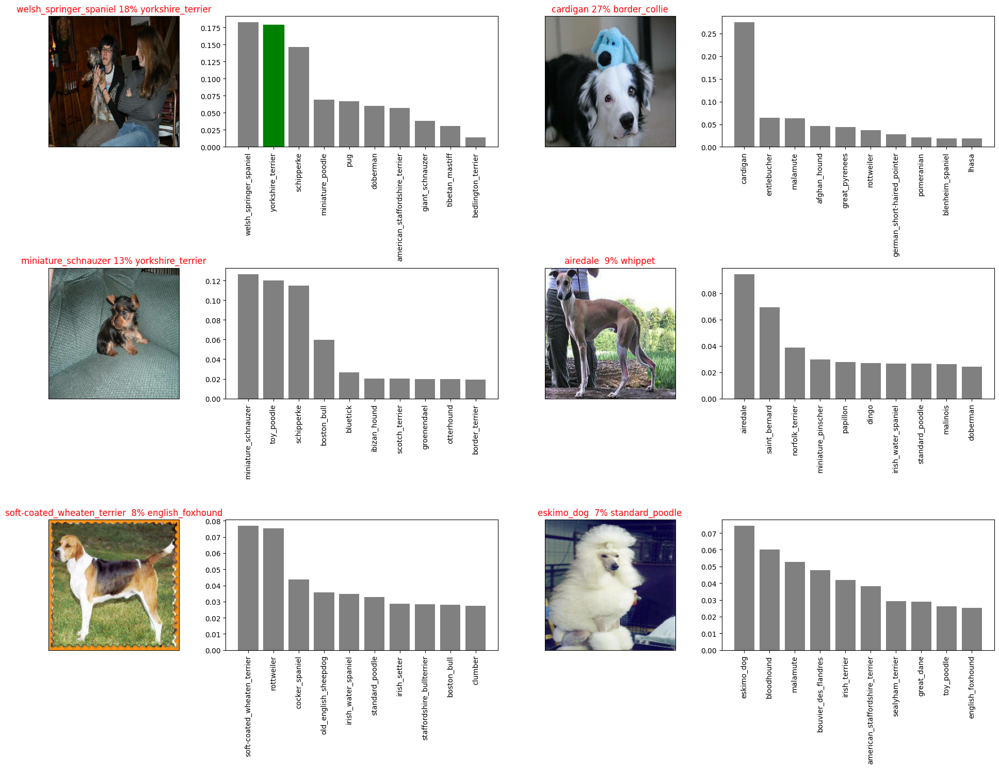

In [63]:

# Let's check out a few predictions and their different values
import matplotlib.pyplot as plt
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  visualize_pred(
      prediction_probabilities = predictions,
      labels = val_labels,
      images = val_images,
      n = i+i_multiplier
  )
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(
      prediction_probabilities = predictions,
      labels = val_labels,
      n = i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a trained model

In [64]:
# Create a function to save a model
def save_model(model,suffix = None):
  """
  Saves a given model in Google Drive.
  """

  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/Dog_Breed_Classification/models/",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [65]:
def load_model(model_path):
  """
  Loads a saved model from Google Drive.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KearsLayer":hub.KerasLayer})
  return model

In [66]:
# save our model trained on 1000 imgaes
save_model(model,suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Breed_Classification/models/20240514-132747-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_Breed_Classification/models/20240514-132747-1000-images-mobilenetv2-Adam.h5'

In [67]:
import tensorflow_hub as hub
from keras.models import load_model

# Define a custom object scope to provide a fallback for unknown objects
def custom_object_scope():
    return {"KerasLayer": hub.KerasLayer}

# Retrieve custom objects dictionary
custom_objects = custom_object_scope()

# Load the model with custom objects
loaded_1000_image_model = load_model("drive/MyDrive/Dog_Breed_Classification/models/20240514-073149-1000-images-mobilenetv2-Adam.h5", custom_objects=custom_objects)

In [68]:
model.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 5.7474 - accuracy: 0.0100


[5.747448921203613, 0.009999999776482582]

In [69]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 5.8347 - accuracy: 0.0050


[5.834718227386475, 0.004999999888241291]

##  Training Model On Full Dataset

In [70]:
len(X),len(y)

(10222, 10222)

In [71]:
# Create a databatch with the full data set
full_data = create_batches(X,y)

Creating training data batches...


In [72]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [73]:
# Create model for full fata set
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [74]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [78]:
# Fit the full model to full data
# full_model.fit(x=full_data,
#             epochs = NUM_EPOCHS,
#             validation_data = None,
#             callbacks = [full_model_tensorboard,
#                          full_model_early_stopping])

In [79]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Breed_Classification/models/20240514-132842-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_Breed_Classification/models/20240514-132842-full-image-set-mobilenetv2-Adam.h5'

In [80]:
import tensorflow_hub as hub
from keras.models import load_model

# Define a custom object scope to provide a fallback for unknown objects
def custom_object_scope():
    return {"KerasLayer": hub.KerasLayer}

# Retrieve custom objects dictionary
custom_objects = custom_object_scope()

# Load the model with custom objects
loaded_full_model = load_model("drive/MyDrive/Dog_Breed_Classification/models/20240514-092917-full-image-set-mobilenetv2-Adam.h5", custom_objects=custom_objects)

In [81]:
loaded_full_model

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get into the same format.

#### To amke predictions on the test data , we'll:
* Get the test image filenames✅
* Convert the filenames into test data batches using `create_batches()` and setting the `test_data` parameter to `True` (since the test data have no labels)✅

* Make predictions array by passing the test batches to the `predict()` method called on our model✅

In [83]:
# Load test image filenames
test_path = "drive/MyDrive/Dog_Breed_Classification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Breed_Classification/test/e2a9a7580a1424bc6531b2b7375338db.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/dd2c0c44f98af0cf223572a1aa189779.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e0165801e47527205e45295aba441972.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e6c9d8058cbc9b1665aecac1ae179288.jpg',
 'drive/MyDrive/Dog_Breed_Classification/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg']

In [84]:
len(test_filenames)

10357

In [85]:
# Create test data batch
test_data = create_batches(test_filenames,test_data = True)

Creating test data batches...


In [86]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 3961s 12s/step


In [88]:
# Save predictions to csv file (for access later)
np.savetxt("drive/MyDrive/Dog_Breed_Classification/preds_array.csv",test_predictions,delimiter=",")

In [89]:
# Load predictions from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog_Breed_Classification/preds_array.csv",delimiter=",")

In [90]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle submission page, we find that it wants our model's prediction probability outputs in a dataframe with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview


To get the data in this format, we'll:
* create a pandas DataFrane with an ID column as well as a column fro each dog breed✅
* Add data to the ID column by extracting the test image ID's from their filepaths✅
* Add data to each pf the dog breed columns✅
* Export the DataFrame as a CSV to submit it to Kaggle✅

In [91]:
# create a panmdas Dataframe
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image id's to dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [96]:
test_ids[:10]

['e2a9a7580a1424bc6531b2b7375338db',
 'e527455253416f809a73886b6003020d',
 'dd2c0c44f98af0cf223572a1aa189779',
 'e2b4d6b6590fa2941e74238248093eb3',
 'e2faaf5e760a6189d0980e6355864b4c',
 'df92d68c07ec91b2f67cec77980e00cf',
 'e587c21aedc81f89b83dd326e034e7e0',
 'e0165801e47527205e45295aba441972',
 'e6c9d8058cbc9b1665aecac1ae179288',
 'e089aa32bc96c2a9753e7a5fcdc1bac9']

In [97]:
preds_df["id"] = test_ids

In [99]:
# Add the prediction prob's to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [100]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2a9a7580a1424bc6531b2b7375338db,5.773627e-07,8.626272e-07,3.490407e-06,5.226178e-06,1.195319e-06,2.472625e-08,4.427644e-06,8.853995e-09,3.585735e-08,...,2.186457e-09,7.022376e-08,7.844769e-10,1.906565e-07,1.962904e-07,9.841428e-09,3.056033e-07,9.881855e-06,7.384510e-07,4.511205e-06
1,e527455253416f809a73886b6003020d,6.020903e-12,6.829336e-06,1.074911e-08,1.511254e-08,1.597410e-10,9.802296e-06,3.754852e-07,2.436931e-06,1.228754e-06,...,2.113688e-09,9.563420e-11,8.551802e-08,6.210592e-05,1.138120e-06,6.775432e-10,1.493513e-09,9.349968e-09,1.951984e-09,3.369201e-10
2,dd2c0c44f98af0cf223572a1aa189779,5.047404e-06,5.805948e-10,1.057031e-07,2.767731e-08,1.529998e-06,7.648449e-09,1.879217e-08,5.087498e-07,8.126823e-09,...,3.681405e-08,4.043975e-07,6.844332e-07,6.436615e-08,7.082158e-07,1.073932e-06,5.880278e-08,1.370212e-06,2.111055e-08,3.435995e-07
3,e2b4d6b6590fa2941e74238248093eb3,1.563297e-08,2.190728e-07,8.319838e-07,6.653363e-09,2.998650e-08,3.908204e-07,2.110913e-07,9.779858e-07,1.037977e-08,...,2.307227e-08,1.058358e-05,7.034208e-06,5.359593e-04,3.177460e-05,8.024041e-07,1.454169e-07,1.675123e-03,5.809737e-04,1.020236e-07
4,e2faaf5e760a6189d0980e6355864b4c,4.435308e-07,2.469348e-05,3.272517e-06,1.748582e-05,5.986952e-08,2.998606e-08,3.679419e-07,3.906960e-08,1.884337e-07,...,1.984650e-09,3.227026e-07,7.178311e-07,1.966014e-02,2.574702e-05,3.478597e-06,7.056649e-04,1.084784e-06,6.776039e-05,2.105629e-05


In [103]:
# save our DF for submission in kaggle
preds_df.to_csv("drive/MyDrive/Dog_Breed_Classification/full_model_predictions_submission_1_mobilenetv2.csv",index = False)

# Hurray!!!! I've made it... 🥳🥳🐶🐱‍🏍🎉🎁



